In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
os.chdir('/home/ak431480')

# Date: 21.10.2025
# Analyzing ARNEO cell2location celltype mapping results

/home/ak431480/.local/lib/python3.11/site-packages/scanpy/_utils/__init__.py:35: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version
/home/ak431480/.local/lib/python3.11/site-packages/scanpy/__init__.py:24: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):
/home/ak431480/.local/lib/python3.11/site-packages/scanpy/readwrite.py:15: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  if Version(anndata.__version__) >= Version("0.11.0rc2"):


In [2]:
## Load spatial data with cell2location mapping results
def load_slide(sample, obs_data, path='/scratch/svc_td_compbio/users/kiviaho/prostate_spatial/data/normalized_visium/'):
    slide = sc.read_h5ad(f'{path}{sample}_normalized.h5ad')
    #slide.obs_names = sample + '_' + slide.obs_names
    obs_data = pd.merge(slide.obs,obs_data[obs_data['sample_id'] == sample],left_index=True, right_index=True,how='right')
    slide = slide[obs_data.index].copy()
    slide.obs = obs_data.copy()
    return slide

In [3]:

spatial_data = sc.read_h5ad('/scratch/svc_td_compbio/users/kiviaho/ARNEO/c2l_dir/cell2location_map/sp.h5ad')
spatial_data.obs[spatial_data.uns['mod']['factor_names']] = spatial_data.obsm['q05_cell_abundance_w_sf'] # Extract the 5% quantile from the posterior distribution

# Map sample annotation
sample_annot_dict = pd.read_excel('./ARNEO_tampere_sample_sheet.xlsx',index_col=0).to_dict()['treatment']
spatial_data.obs['type'] = spatial_data.obs['sample_id'].map(sample_annot_dict)
spatial_data.obs['type'] = pd.Categorical(spatial_data.obs['type'],categories=['naive','ADT','ADT+APA'])

# Celltype_annotation
#celltype_annotation_df = pd.read_excel('./single_cell_celltype_annotation.xlsx',index_col=0)
#celltype_annot_dict = celltype_annotation_df.to_dict()['celltype name']

# Scale down the outlier Epithelial cell_0 to test feasibility otherwise NOTE: DELETE BEFORE FINAL ANALYSIS
#spatial_data.obs['Epithelial cell_0'] = spatial_data.obs['Epithelial cell_0'] / 5

# Create obs data df
obs_data_df = spatial_data.obs.copy()

celltypes = spatial_data.uns['mod']['factor_names']
celltypes = obs_data_df[celltypes].mean().sort_values(ascending=False).index.to_list()

samples = list(sample_annot_dict.keys())


In [4]:
df = obs_data_df[celltypes]
#df.columns = df.columns.map(celltype_annot_dict)
df.describe()[df.columns[:10]]

,Epithelial cell_10.0,Epithelial cell_1.0,Fibroblast_1,Epithelial cell_6.0,Fibroblast_0,Epithelial cell_9.0,Fibroblast_3,Epithelial cell_2.0,Fibroblast_2,Epithelial cell_3.0
count,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000,36790.000000
mean,3.785501,2.501369,2.181520,1.278954,0.746988,0.640633,0.490339,0.477447,0.266692,0.220449
std,6.518524,3.279642,2.804659,1.972807,0.921567,1.076245,0.618592,0.904699,0.358075,0.528328
min,0.000396,0.000008,0.000005,0.000086,0.000006,0.000204,0.000005,0.000115,0.000020,0.000166
25%,0.112307,0.160604,0.202729,0.023947,0.083041,0.043433,0.049103,0.032650,0.025069,0.019257
50%,0.501847,1.746977,1.045728,0.225108,0.442533,0.156905,0.279715,0.144895,0.130322,0.060475
75%,4.982341,3.262790,3.261295,1.972604,1.087755,0.783445,0.716207,0.517426,0.398078,0.198867
max,89.180862,40.721939,37.807697,24.548655,14.188380,16.461475,9.161408,18.139587,5.297798,16.371317


/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


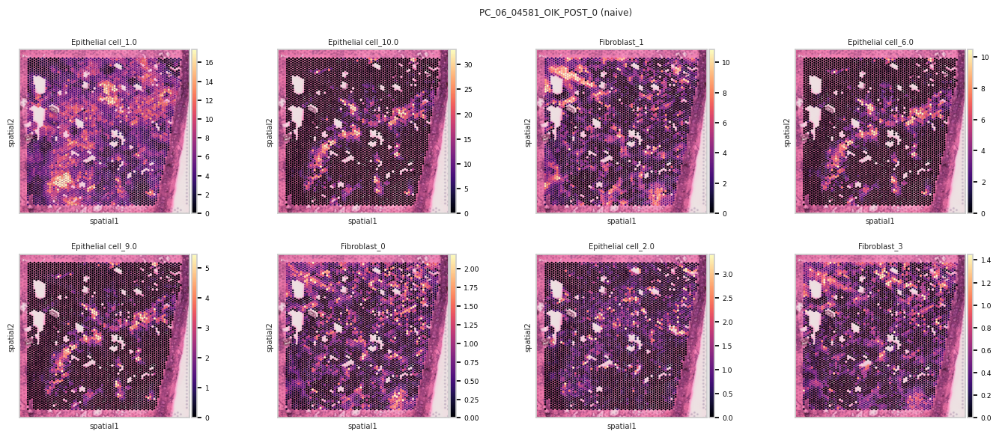

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


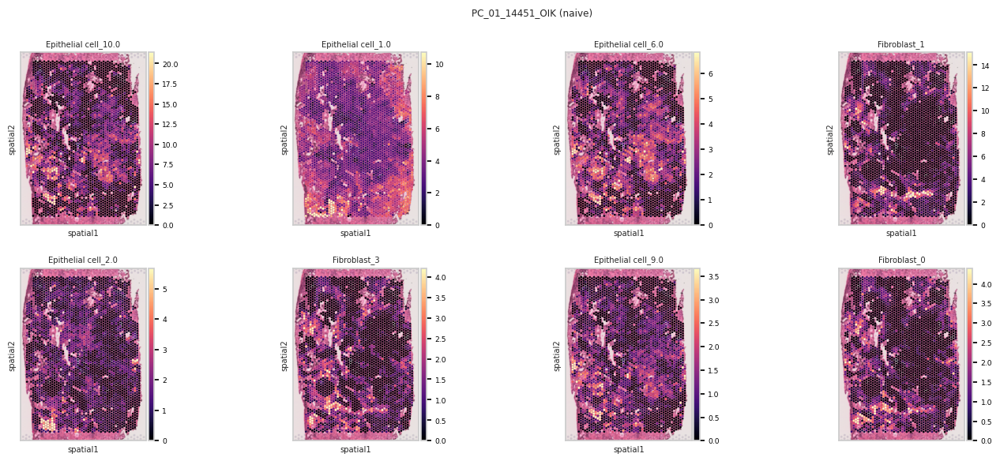

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


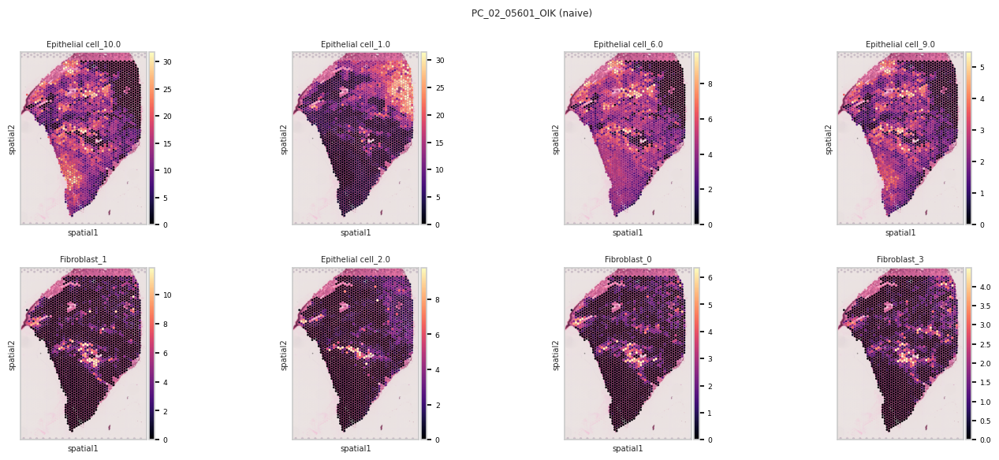

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


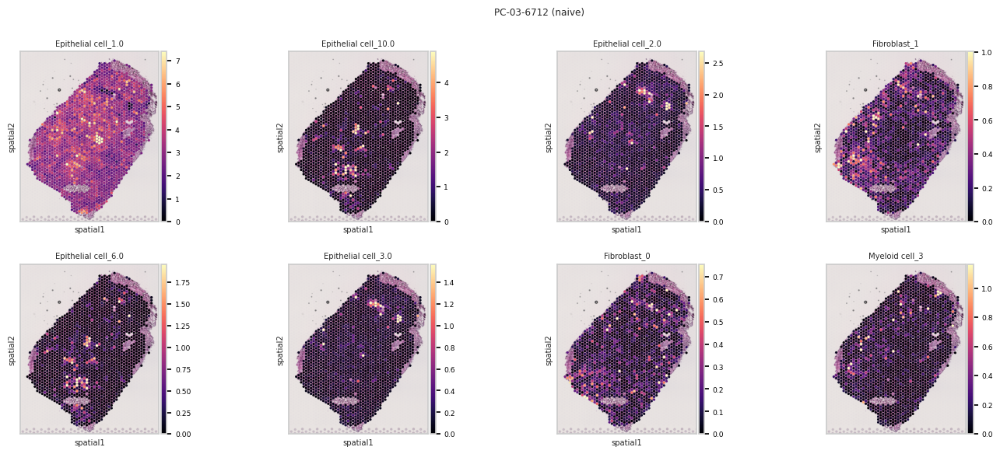

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


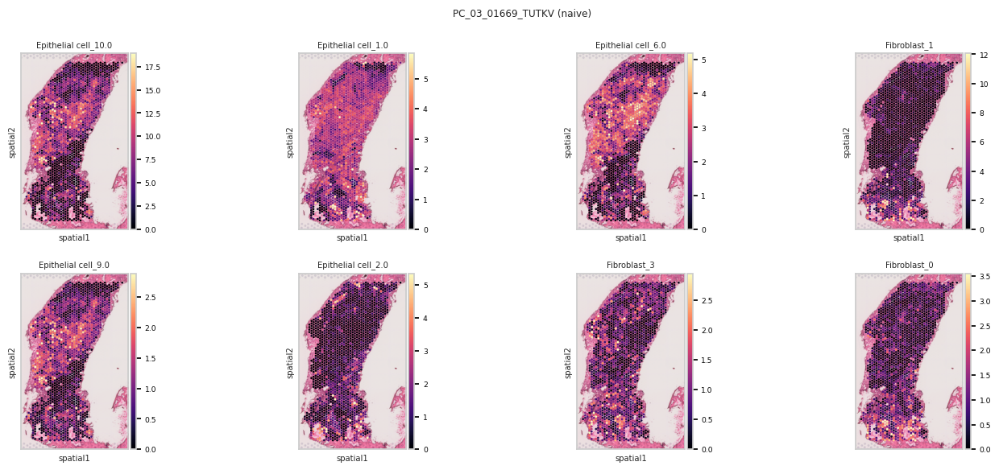

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


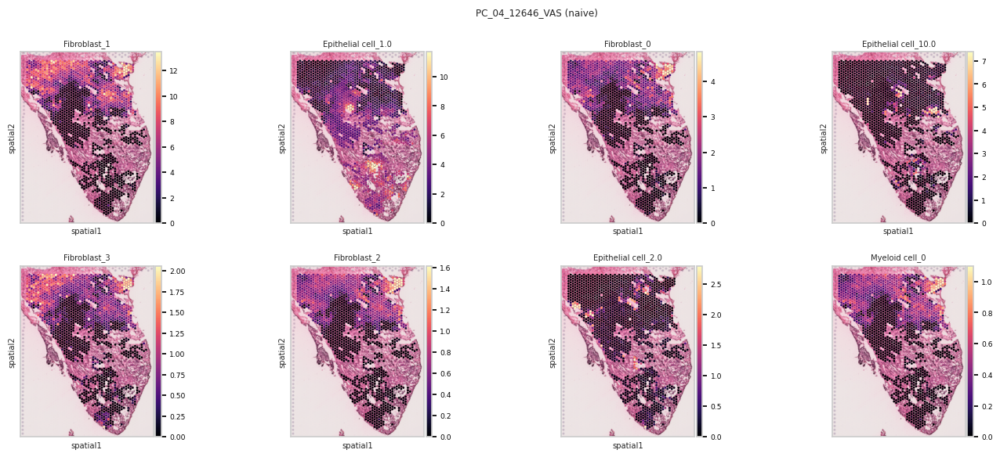

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


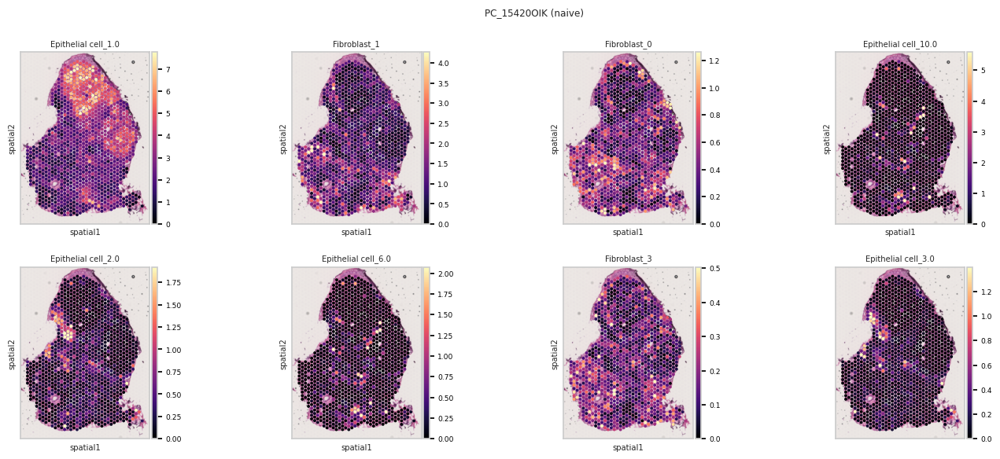

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


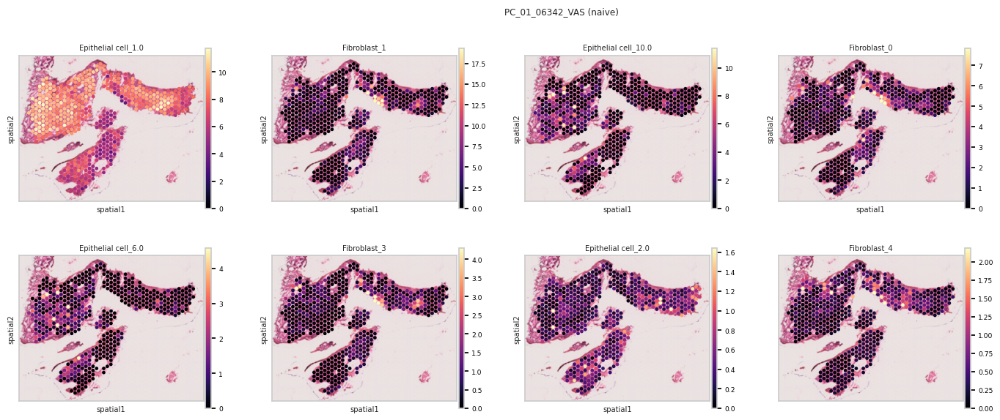

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


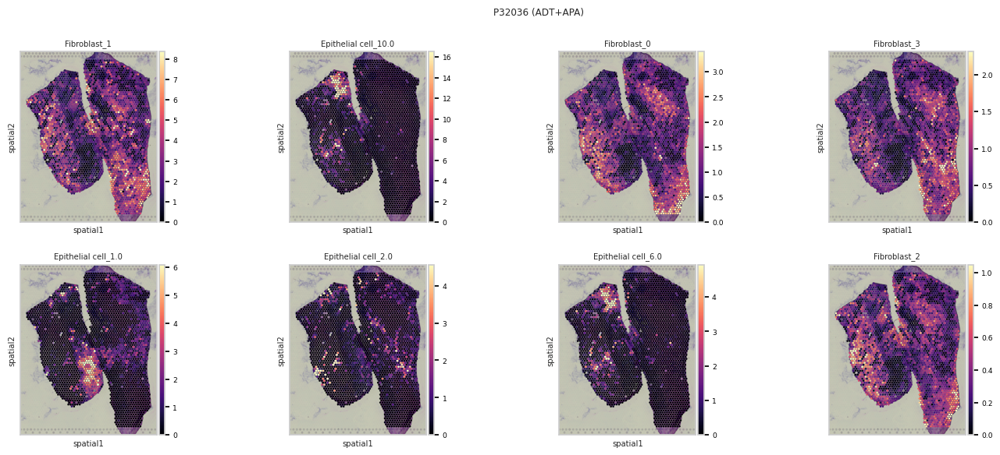

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


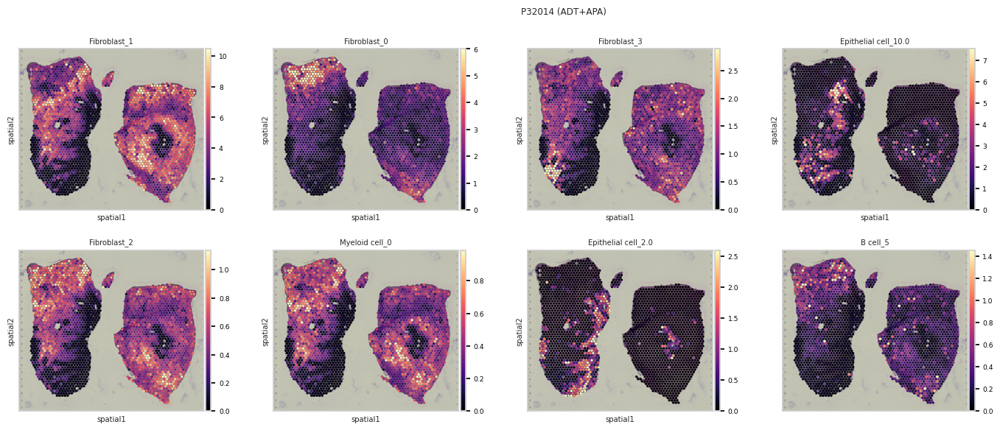

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


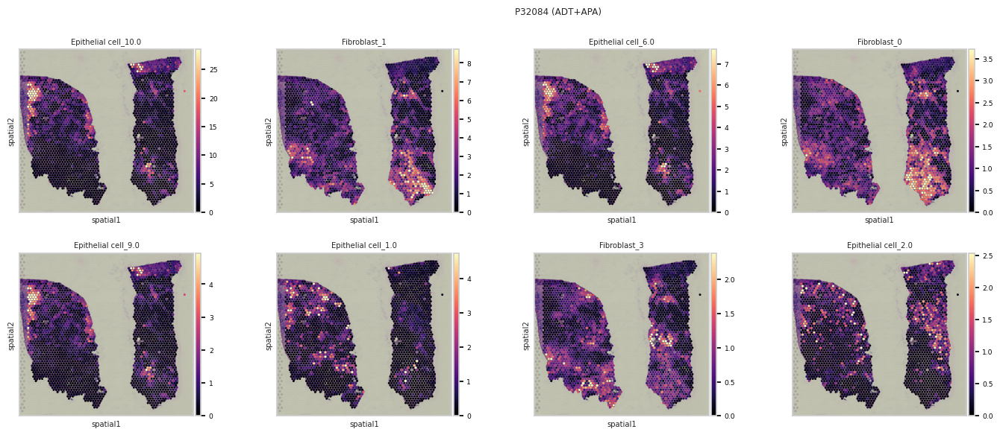

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


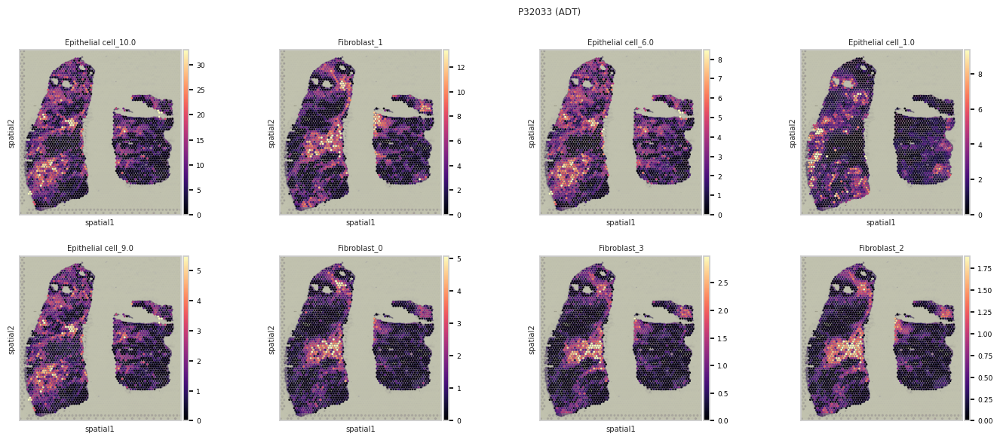

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


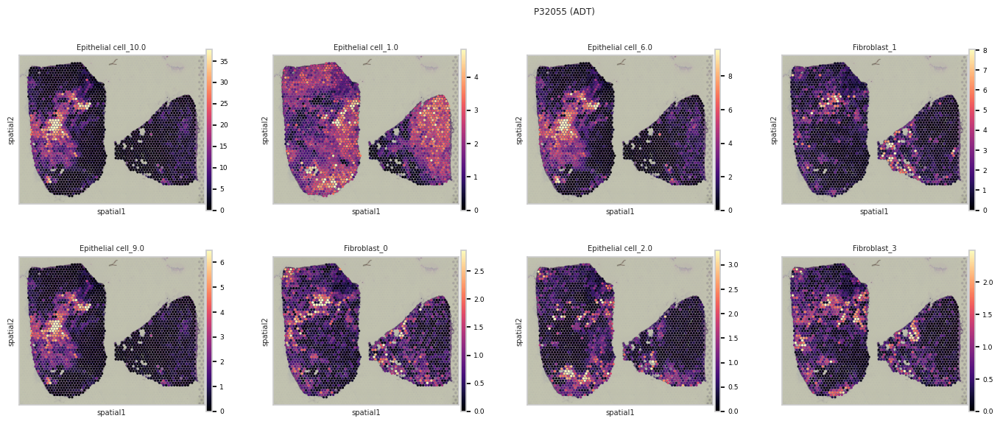

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


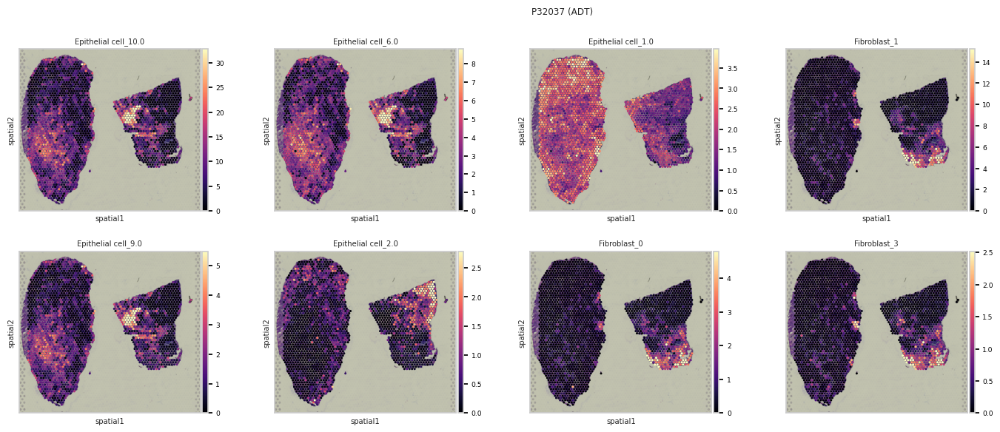

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


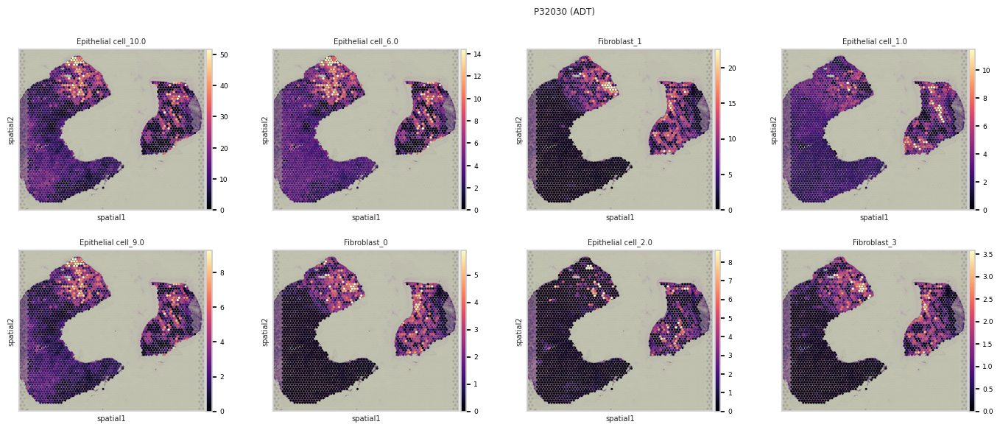

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


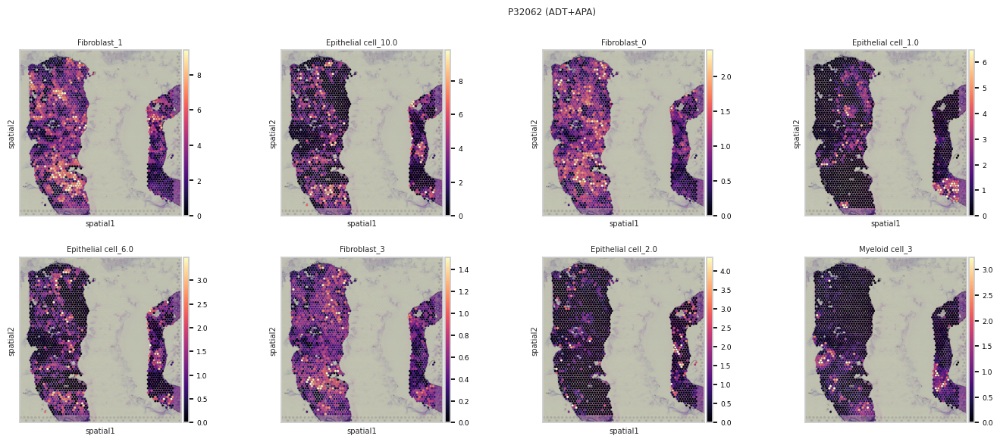

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


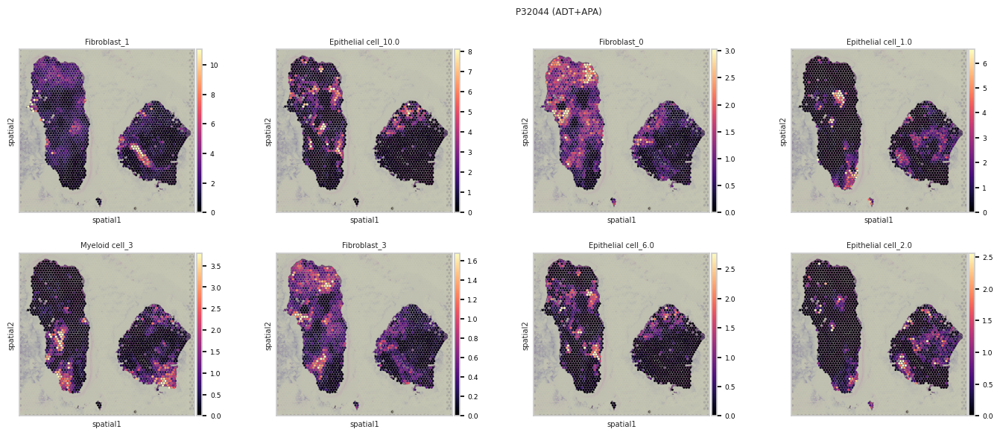

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


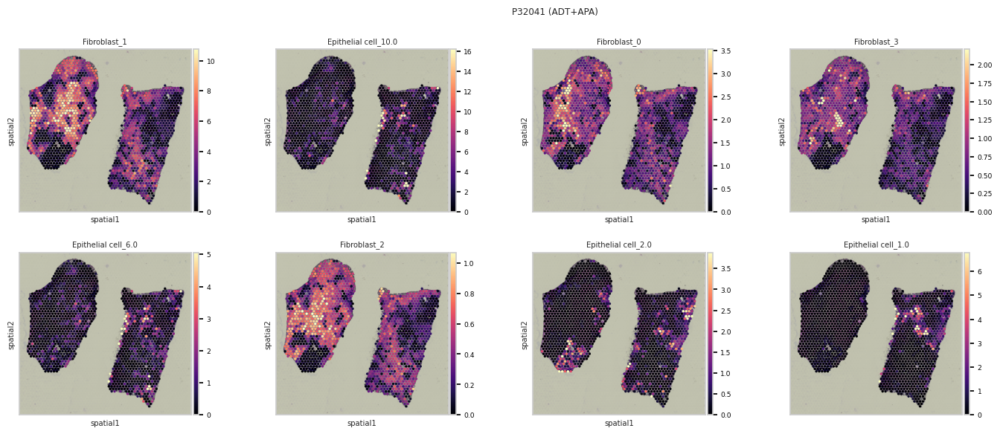

/tmp/ipykernel_102084/195755704.py:28: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
/tmp/ipykernel_102084/195755704.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


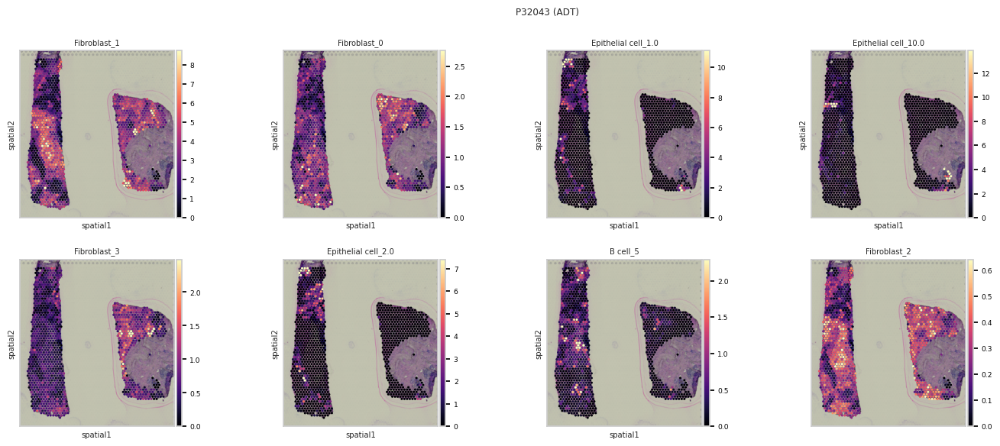

In [5]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting

sns.set_theme(
    style='whitegrid',
    font_scale=0.6,
    rc={
        'xtick.bottom': True,
        'ytick.left': True,
        'xtick.major.size': 4,
        'ytick.major.size': 4,
        'xtick.color': 'black',
        'ytick.color': 'black'
    }
)

# All samples
for sample in samples:

       slide = load_slide(sample,obs_data_df)
       celltypes_slide = slide.obs[celltypes].mean().sort_values(ascending=False).index.to_list()
       #slide.obs = slide.obs.rename(columns=celltype_annot_dict)
       
       # plot in spatial coordinates
       with mpl.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [3.3, 3]}):

              fig = sc.pl.spatial(
              slide,
              cmap='magma',
              #color=[celltype_annot_dict[k] for k in celltypes_slide[:8]],
              color=[k for k in celltypes_slide[:8]],
              ncols=4,
              size=1.3,
              img_key='lowres',
              vmin=0,
              vmax='p99.2',
              show=False,        # 👈 important
              return_fig=True    # 👈 return the figure instead of showing it
              )
       sampletype = sample_annot_dict[sample]
       fig.suptitle(f'{sample} ({sampletype})')  # 👈 add title to that figure
       plt.xlabel(None)
       plt.ylabel(None)
       fig.tight_layout()
       #fig.savefig(f'./plots/{sample}_most_abundant_celltypes_on_spatial.pdf')
       plt.show()
       #plt.close(fig)



## Add pathology annotation

In [6]:
tampere_pc = [s for s in samples if 'PC_' in s]
annot_lst = []
for sample in tampere_pc:
    annot = pd.read_csv(f'/scratch/svc_td_compbio/users/kiviaho/prostate_spatial/data/pathology_annotation_exclude_info/{sample}.csv',index_col=0)
    annot.index = sample + '_' + annot.index
    annot_lst.append(annot)
tampere_pathology_annotation = pd.concat(annot_lst)
tampere_pathology_annotation.columns = ['Pathology.Annotations']
tampere_pathology_annotation.head()
tampere_pathology_annotation.to_csv('./ST_pathology_annotation/Tampere_pathology_annotations_20251021.csv')

In [7]:
tampere_pathology_annot = pd.read_csv('./ST_pathology_annotation/Tampere_pathology_annotations_20251021.csv',index_col=0)
arneo_pathology_annot = pd.read_csv('./ST_pathology_annotation/ARNEO_pathology_annotations_20251021.csv',index_col=0)
arneo_pathology_annot = arneo_pathology_annot[['Pathology.Annotations']]

pathology_annotations = pd.concat([tampere_pathology_annot,arneo_pathology_annot],axis=0)
pathology_annotations.head()

,Pathology.Annotations
PC_06_04581_OIK_POST_0_AAACAACGAATAGTTC-1,Stroma
PC_06_04581_OIK_POST_0_AAACAAGTATCTCCCA-1,Benign
PC_06_04581_OIK_POST_0_AAACAATCTACTAGCA-1,Benign
PC_06_04581_OIK_POST_0_AAACACCAATAACTGC-1,Stroma
PC_06_04581_OIK_POST_0_AAACAGAGCGACTCCT-1,Stroma


In [8]:
# Merge in the pathology annotation
obs_data_df = pd.merge(obs_data_df,pathology_annotations,left_index=True,right_index=True,how='left')

In [9]:
# Annotate tissue in 4 separate categories:
# Tumour 
# Benign
# Stroma
# drop

pathology_mapping_dict = {
    # Tampere annotation format
    'Stroma': 'Stroma',
    'Benign': 'Benign',
    'Gleason 4': 'Tumour > 50%',
    'Exclude': 'drop',
    'Gleason 3': 'Tumour < 50%',
    'Gleason 4 cribriform': 'Tumour > 50%',
    'Inflammation': 'Stroma',
    'Gleason 5': 'Tumour > 50%',
    'Atrophy': 'Benign',
    'Lumen': 'drop',

    ## ARNEO annotation format
    'Stroma' : 'Stroma',
    'Tumor51-100' : 'Tumour > 50%',
    'Benign51-100' : 'Benign',
    'Benign1-50' : 'Benign',
    'Out of focus - exclude': 'drop',
    'Ignore' : 'drop',
    'Tumor1-50' : 'Tumour < 50%',
    'Epithelium - benign' : 'Benign',
    'Tumour >50%' : 'Tumour > 50%',
    'Tumour <50%' : 'Tumour < 50%',
    #'HGPIN' : 'Benign',
    'HGPIN' : 'drop',
    'Fold - exclude' : 'drop',
    'Epithelium - difficult to assess':'drop',
    'Tumour<50%': 'Tumour < 50%',
    'MixedEpithelium' : 'Benign',
    'Mixed' : 'Benign',
    'Mixed normal epithelium':'Benign',
    'No tissue - exclude' : 'drop',
    'Out of focus - exclude':'drop',
    'Seminal vesicle - benign':'drop',
    'Coropora amylacea - exclude':'drop',
    'Unable to assess - exclude':'drop'
    }

obs_data_df['Pathology'] = obs_data_df['Pathology.Annotations'].map(pathology_mapping_dict)
obs_data_df = obs_data_df[~(obs_data_df['Pathology'] == 'drop')]
obs_data_df['Pathology'] = pd.Categorical(obs_data_df['Pathology'],categories = ['Tumour > 50%', 'Tumour < 50%', 'Benign', 'Stroma'])

# Replace two-way tumour annotation with just "Tumour"
obs_data_df['Pathology'] = obs_data_df['Pathology'].replace({'Tumour > 50%': 'Tumour', 'Tumour < 50%': 'Tumour'})

/tmp/ipykernel_102084/2286162034.py:51: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  obs_data_df['Pathology'] = obs_data_df['Pathology'].replace({'Tumour > 50%': 'Tumour', 'Tumour < 50%': 'Tumour'})


In [10]:
# Get the broad cell type prefix from each fine-grained cell type
broad_celltypes = [c.split('_')[0] for c in celltypes]

# Map each broad cell type to its constituent fine cell type columns
from collections import defaultdict
broad_to_fine = defaultdict(list)
for c, broad in zip(celltypes, broad_celltypes):
    broad_to_fine[broad].append(c)

# Compute mean abundance per broad cell type
broad_means = {
    broad: obs_data_df[cols].mean().sum()
    for broad, cols in broad_to_fine.items()
}

# Sort by descending mean abundance
broad_celltypes_sorted = sorted(broad_means.keys(), key=lambda k: broad_means[k], reverse=True)

# Optional: print summary
for b in broad_celltypes_sorted:
    print(f"{b}: {broad_means[b]:.3f}")

# Overwrite your variable if you want to use it directly
broad_celltypes = broad_celltypes_sorted


Epithelial cell: 10.437
Fibroblast: 3.885
Myeloid cell: 0.628
B cell: 0.531
Endothelial cell: 0.418
T cell: 0.370
Mast cell: 0.196


/tmp/ipykernel_102084/1843251509.py:68: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_102084/1843251509.py:69: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_102084/1843251509.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_102084/1843251509.py:68: 

<Figure size 640x480 with 0 Axes>

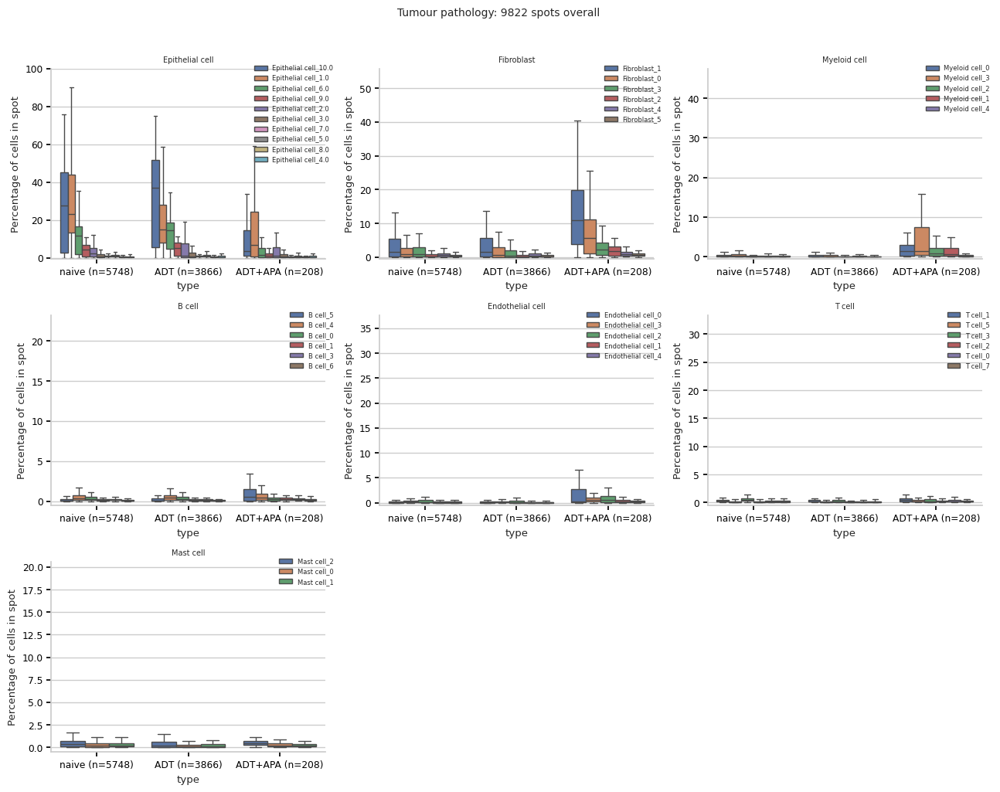

/tmp/ipykernel_102084/1843251509.py:68: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_102084/1843251509.py:69: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_102084/1843251509.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_102084/1843251509.py:68: 

<Figure size 640x480 with 0 Axes>

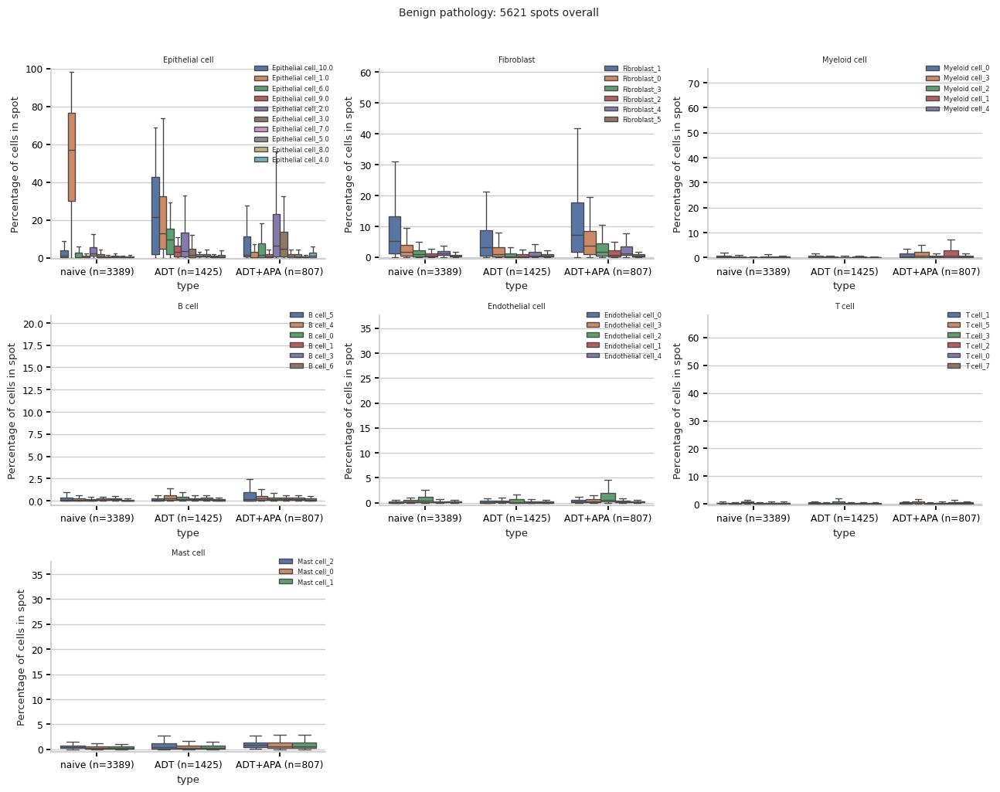

/tmp/ipykernel_102084/1843251509.py:68: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
/tmp/ipykernel_102084/1843251509.py:69: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[1]} (n={vcounts[1]})',
/tmp/ipykernel_102084/1843251509.py:70: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f'{sample_types[2]} (n={vcounts[2]})'])
/tmp/ipykernel_102084/1843251509.py:68: 

<Figure size 640x480 with 0 Axes>

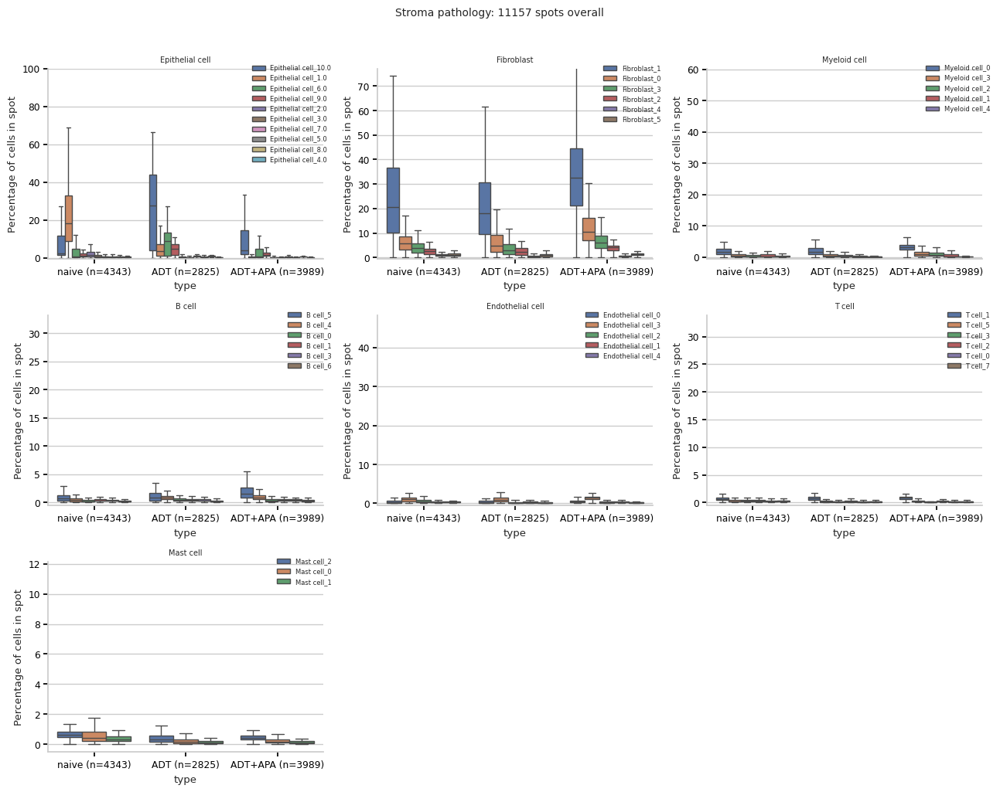

In [15]:
sns.set_theme(
    style='whitegrid',
    font_scale=0.8,
    rc={
        'xtick.bottom': True,
        'ytick.left': True,
        'xtick.major.size': 4,
        'ytick.major.size': 4,
        'xtick.color': 'black',
        'ytick.color': 'black'
    }
)

pathology_regions = obs_data_df['Pathology'].cat.categories.copy()

obs_data_df_subset = obs_data_df.copy()
# compute row sums fresh for the subset
row_sums = obs_data_df_subset[celltypes].sum(axis=1)
obs_data_df_subset[celltypes] = obs_data_df_subset[celltypes].div(row_sums, axis=0)

# Grid layout
n_rows, n_cols = 3, 3

for pathology_region in pathology_regions:
    plot_df = obs_data_df_subset[obs_data_df_subset['Pathology'] == pathology_region]

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(13, 10))
    axes = axes.flatten()

    for i, ctype in enumerate(broad_celltypes):
        if i >= n_rows * n_cols:
            break

        ax = axes[i]
        #celltypes_to_plot = celltype_annotation_df[celltype_annotation_df['broad celltype'] == ctype]['celltype name'].tolist()
        celltypes_to_plot = [c for c in celltypes if ctype in c]
        #plot_df = plot_df.rename(columns=celltype_annot_dict)

        try:
            melted = plot_df.melt(
                id_vars='type',
                value_vars=celltypes_to_plot,
                var_name=ctype,
                value_name='Fraction'
            )
            melted['Fraction'] = melted['Fraction'] * 100

            sns.boxplot(
                data=melted,
                x='type',
                y='Fraction',
                hue=ctype,
                fliersize=0,
                ax=ax
            )

            if ctype == 'Epithelial cell':
                ax.set_ylim(-0.5, 100)
            else:
                ax.set_ylim(-0.5, melted['Fraction'].quantile(0.9999))
            ax.set_ylabel('Percentage of cells in spot')
            ax.set_title(ctype, fontsize=7)
            ax.spines[['top', 'right']].set_visible(False)

            sample_types = plot_df['type'].cat.categories
            vcounts = plot_df['type'].value_counts().loc[sample_types]

            ax.set_xticklabels([f'{sample_types[0]} (n={vcounts[0]})',
                                f'{sample_types[1]} (n={vcounts[1]})',
                                f'{sample_types[2]} (n={vcounts[2]})'])

            # Legend styling — small and non-overlapping
            ax.legend(
                title=None,
                fontsize=6,
                loc='upper right',
                frameon=False,
                bbox_to_anchor=(1.05, 1.05)
            )

        except Exception as e:
            ax.set_visible(False)
            continue

    # Hide unused subplots if fewer than 9 broad types
    for j in range(len(broad_celltypes), n_rows * n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f'{pathology_region} pathology: {np.sum(vcounts)} spots overall', fontsize=10, y=1.02)
    fig.tight_layout()
    plt.show()
    plt.clf()


In [26]:
obs_data_df['sample_id'].unique()

['PC_15420OIK', 'PC_04_12646_VAS', 'PC-03-6712', 'PC_02_05601_OIK', 'PC_01_14451_OIK', ..., 'P32043', 'P32044', 'P32055', 'P32062', 'P32084']
Length: 19
Categories (19, object): ['P32014', 'P32030', 'P32033', 'P32036', ..., 'PC_03_01669_TUTKV', 'PC_04_12646_VAS', 'PC_06_04581_OIK_POST_0', 'PC_15420OIK']